<!-- # Sensor readings from a wall-following robot -->
# Lectura de sensores de un robot siguendo la pared

ver [datos](https://www.kaggle.com/uciml/wall-following-robot)


Dado que los datos son series de tiempo, pienso que no sirven las estrategias de regresion, ni 


In [1]:
# Importando librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
sns.set_style('whitegrid')


In [2]:
# Version de Pandas
pd.__version__
import os
print(os.listdir("."))

['P01-bases_datos.ipynb', 'Data', 'P02-Preproceso.ipynb']


# Alguna explicación de los datos

Slight right -> meaning that the road changes directly slightly, perhaps less than 15 degrees, and you should follow the road to the right.


In [4]:
# import data
df = pd.read_csv("Data/robot_wall_follower/sensor_readings_4.csv",header=None,
                 names=["sd_front", "sd_left", "sd_right", "sd_back","target"])
#df.columns
#df.index
# df.feature_names = ["sd_front","sd_left","sd_right","sd_back"]


In [ ]:
#rename columns
# dic_names ={ 
#     "sd_front" : "new_name",
#     "sd_left"  : "new_name2",
#    ...
# }
# df.rename(columns=dic_names).head()

In [5]:
df.head()
# df.dtypes ## Name and type of each column
# df.dtypes.value_counts() ## return the count of each data type
# df.sample(n=5, random_state=42) ## visualiza columnas aleatorias
# df.value_counts

,sd_front,sd_left,sd_right,sd_back,target
0,1.687,0.445,2.332,0.429,Slight-Right-Turn
1,1.687,0.449,2.332,0.429,Slight-Right-Turn
2,1.687,0.449,2.334,0.429,Slight-Right-Turn
3,1.687,0.449,2.334,0.429,Slight-Right-Turn
4,1.687,0.449,2.334,0.429,Slight-Right-Turn


In [6]:
df.describe()

,sd_front,sd_left,sd_right,sd_back
count,5456.000000,5456.000000,5456.000000,5456.000000
mean,1.290307,0.681269,1.881819,1.273689
std,0.626700,0.342594,0.562533,0.821750
min,0.495000,0.340000,0.836000,0.367000
25%,0.826000,0.495000,1.472000,0.788000
50%,1.089500,0.612000,1.753000,1.066500
75%,1.519500,0.753000,2.139000,1.400500
max,5.000000,5.000000,5.000000,5.000000


In [7]:
##df["target"].value_counts() # Este metodo por index no autocompleta jupyter
df.target.value_counts() ## notacion punto 

Move-Forward         2205
Sharp-Right-Turn     2097
Slight-Right-Turn     826
Slight-Left-Turn      328
Name: target, dtype: int64

/home/javier/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


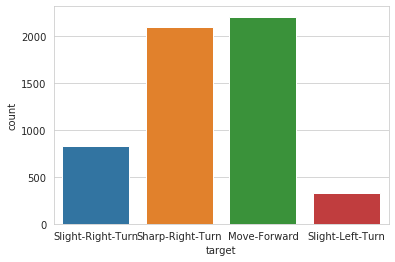

In [8]:
sns.countplot(df.target, label="Count")


Observamos que las clases estan desvalanceadas y los datos son pocos para la clases de  Slight-Right-turn y Slight-Left_turn.

Revisamos si hay datos nulos

In [9]:
df.isnull().sum()

sd_front    0
sd_left     0
sd_right    0
sd_back     0
target      0
dtype: int64

In [10]:
df.isna().sum()

sd_front    0
sd_left     0
sd_right    0
sd_back     0
target      0
dtype: int64

No hay datos nulos ni NAN

Como es serie de tiempo lo vamos a ver como datos que dependen del tiempo

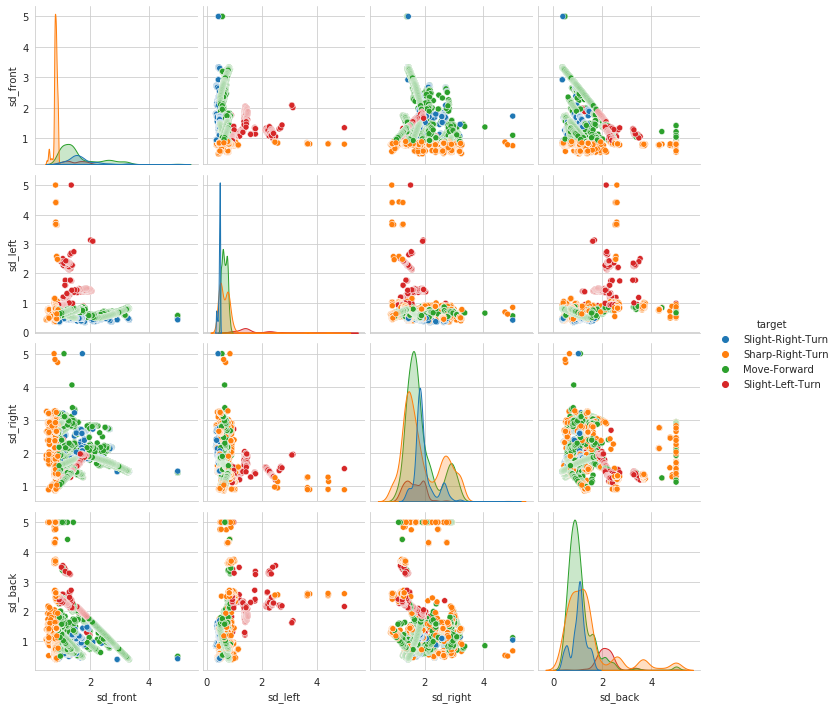

In [47]:
sns.pairplot(df, hue='target', vars=[
             "sd_front", "sd_left", "sd_right", "sd_back"])


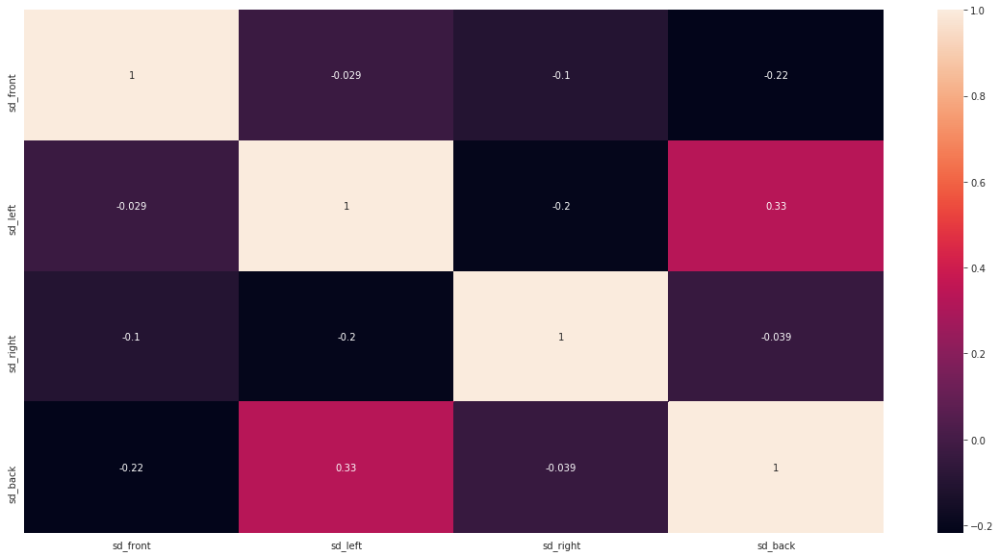

In [49]:
# Let's check the correlation between the variables
# 
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(), annot=True)


## Matriz de correlación, se debe prestar atención a
## todo lo que se aleje del cero, mas claros es correlacion positiva, entre mas oscura hay una correlación negativa, se debe analizar con relacion a la variable target, las dos + y -

## Si hay alguna variable que tenga valores cercanos a cero con todas las demas caracteristicas, entonces se omite.
